In [ ]:
pip install gspread pandas gspread-dataframe

In [48]:
import pandas as pd
import numpy as np
import tensorflow as tf
import random
import requests
import os
from io import StringIO
from dotenv import load_dotenv
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import gspread
from gspread_dataframe import set_with_dataframe

In [ ]:
load_dotenv()
GITHUB_TOKEN = os.getenv("GITHUB_TOKEN")


In [ ]:
dataset_url = "https://raw.githubusercontent.com/lscampov98/TFM/dev/turismo_receptor.csv"

# Realizar la solicitud GET con autenticación
headers = {"Authorization": f"token {GITHUB_TOKEN}"}
response = requests.get(dataset_url, headers=headers)

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
    # Convertir el contenido a un DataFrame de pandas
    data = StringIO(response.text)
    df = pd.read_csv(data, sep=';', encoding='latin-1')
    print(df.head(5))
else:
    print(f"Error {response.status_code}: {response.text}")

In [62]:
# Cargar los datos
balears_data = df[df['CCAA_DESTINO'] == 'Illes Balears']

# Preprocesar los datos
balears_data = balears_data.copy()
balears_data['FECHA'] = pd.to_datetime({'year': balears_data['AÑO'], 'month': balears_data['MES'], 'day': 1})
balears_data = balears_data[['FECHA', 'PAIS_ORIGEN', 'TURISTAS']]

# Crear un dataframe pivotado para que cada país sea una columna
pivot_data = balears_data.pivot(index='FECHA', columns='PAIS_ORIGEN', values='TURISTAS').fillna(0)

# Normalizar los datos
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(pivot_data)



In [85]:
# Preparar los datos para la LSTM
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data)-time_step-1):
        a = data[i:(i+time_step), :]
        X.append(a)
        Y.append(data[i + time_step, :])
    return np.array(X), np.array(Y)

time_step = 20 # Usaremos los datos de los últimos 12 meses para predecir el siguiente mes
X, Y = create_dataset(scaled_data, time_step)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.80)
test_size = len(X) - train_size
X_train, X_test = X[0:train_size], X[train_size:len(X)]
Y_train, Y_test = Y[0:train_size], Y[train_size:len(Y)]



In [87]:
# Crear el modelo LSTM
from tensorflow.keras.optimizers import Adam

model = Sequential() 
model.add(LSTM(units=34, return_sequences=True, input_shape=(time_step, X.shape[2])))
model.add(Dropout(0.2)) 
model.add(LSTM(units=34, return_sequences=False)) 
model.add(Dropout(0.2)) 
model.add(Dense(units=X.shape[2]))

# Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=['mae'])

# Entrenar el modelo
model.fit(X_train, Y_train, epochs=100, batch_size=1, verbose=1)


Epoch 1/100


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.1160 - mae: 0.2377
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0911 - mae: 0.2126
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0669 - mae: 0.1833 
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0974 - mae: 0.2396
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0537 - mae: 0.1641
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0619 - mae: 0.1931
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0510 - mae: 0.1760
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0357 - mae: 0.1410
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0351 - mae: 0.1370
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0255 - mae: 0.1123
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0237 - mae: 0.1085
Epoch 12/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0343 - mae: 0.1274
Epoch 13/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s

In [88]:
# Hacer predicciones
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Invertir la normalización
train_predict = scaler.inverse_transform(train_predict)
Y_train = scaler.inverse_transform(Y_train)
test_predict = scaler.inverse_transform(test_predict)
Y_test = scaler.inverse_transform(Y_test)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


In [89]:
# Calcular el error cuadrático medio
train_score = np.sqrt(mean_squared_error(Y_train, train_predict))
test_score = np.sqrt(mean_squared_error(Y_test, test_predict))
print(f'RMSE de entrenamiento: {train_score:.2f}')
print(f'RMSE de prueba: {test_score:.2f}')



RMSE de entrenamiento: 8065.17
RMSE de prueba: 9809.48


In [90]:
from sklearn.metrics import r2_score

# Calcular el coeficiente de determinación R^2 
train_r2 = r2_score(Y_train, train_predict) 
test_r2 = r2_score(Y_test, test_predict) 
print(f'R^2 de entrenamiento: {train_r2:.2f}') 
print(f'R^2 de prueba: {test_r2:.2f}')

R^2 de entrenamiento: 0.86
R^2 de prueba: 0.50


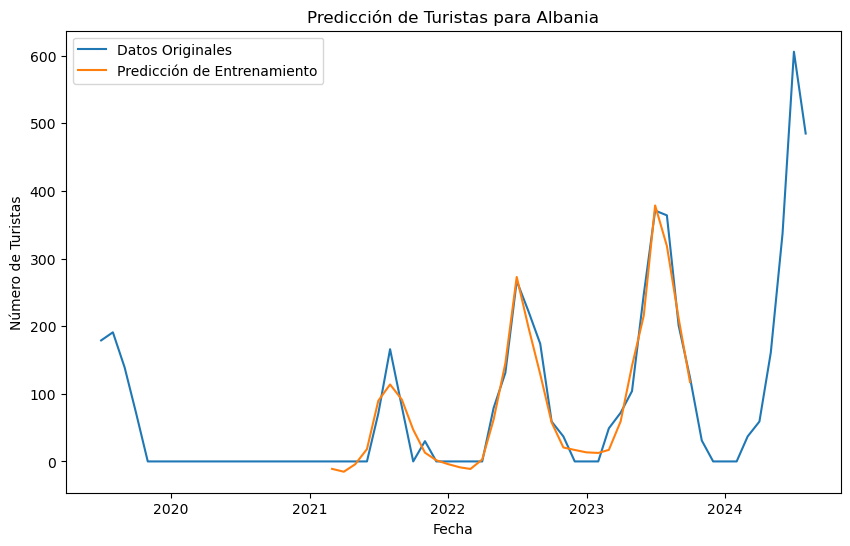

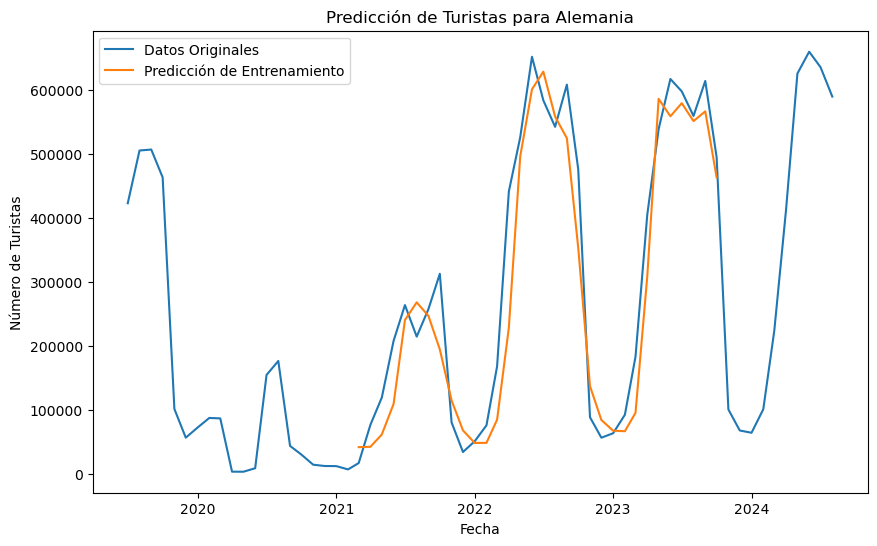

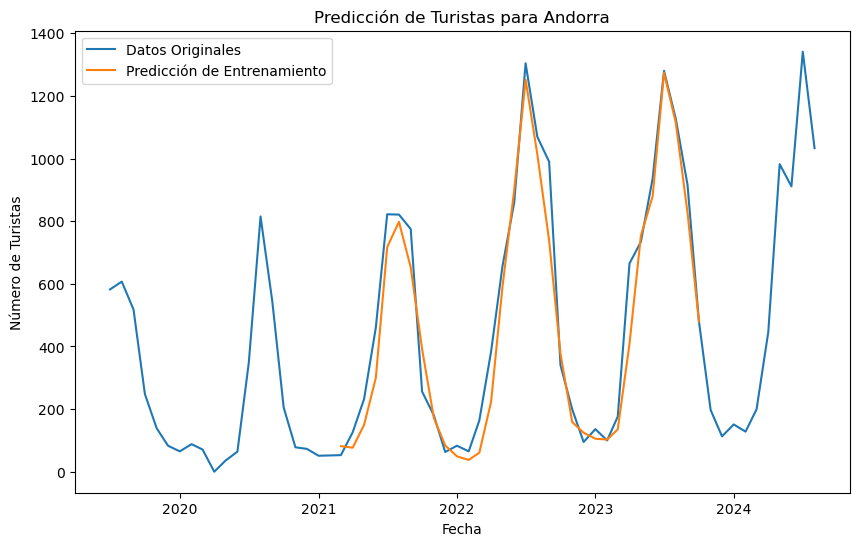

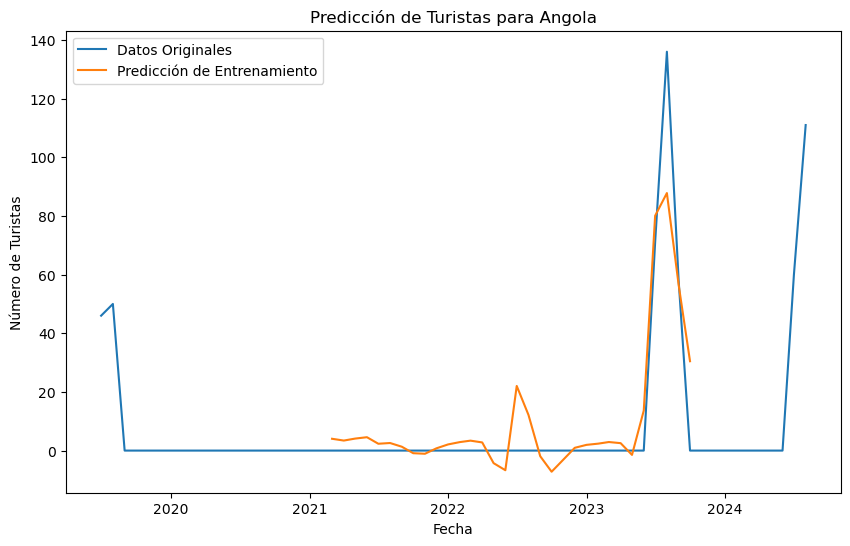

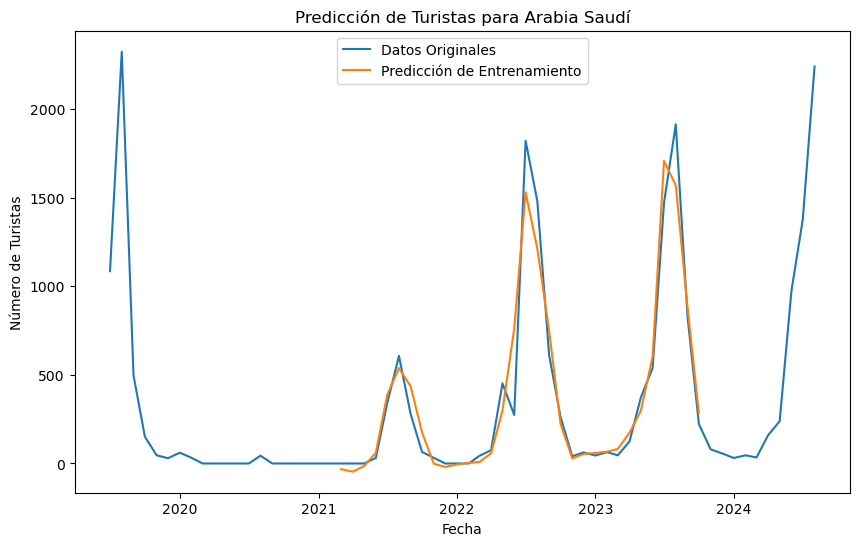

...

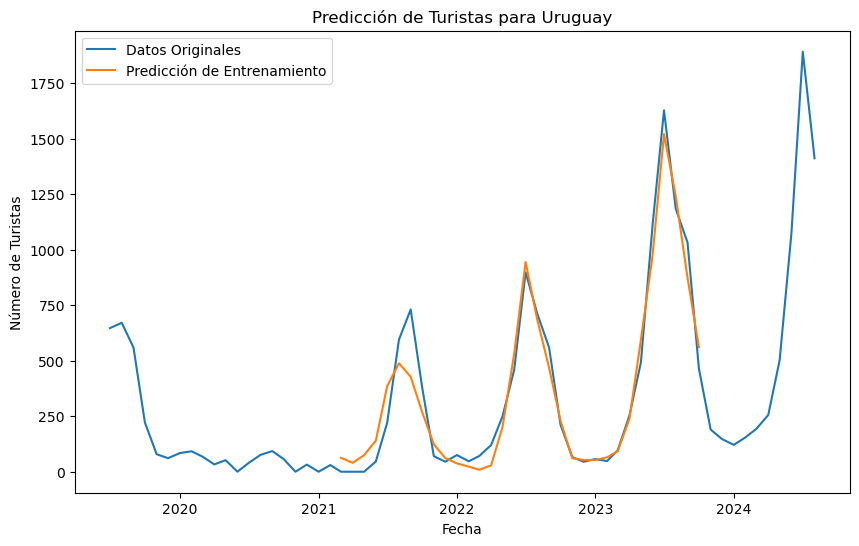

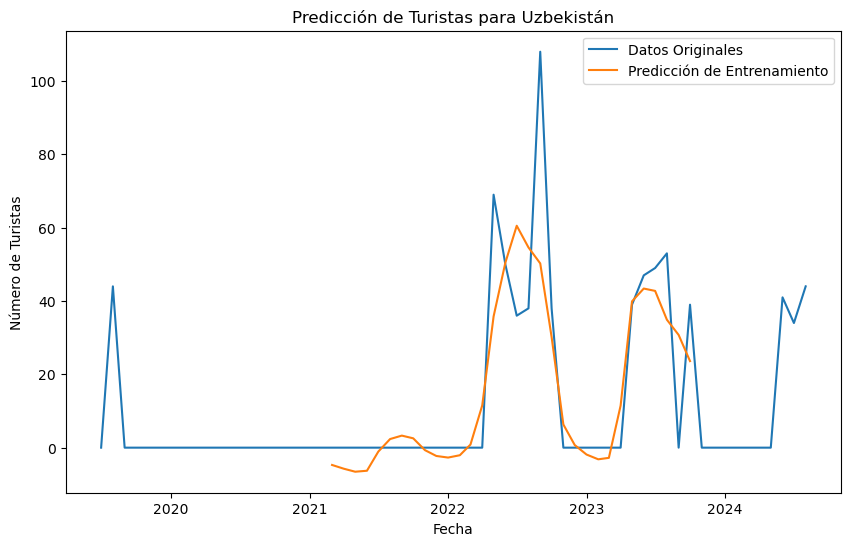

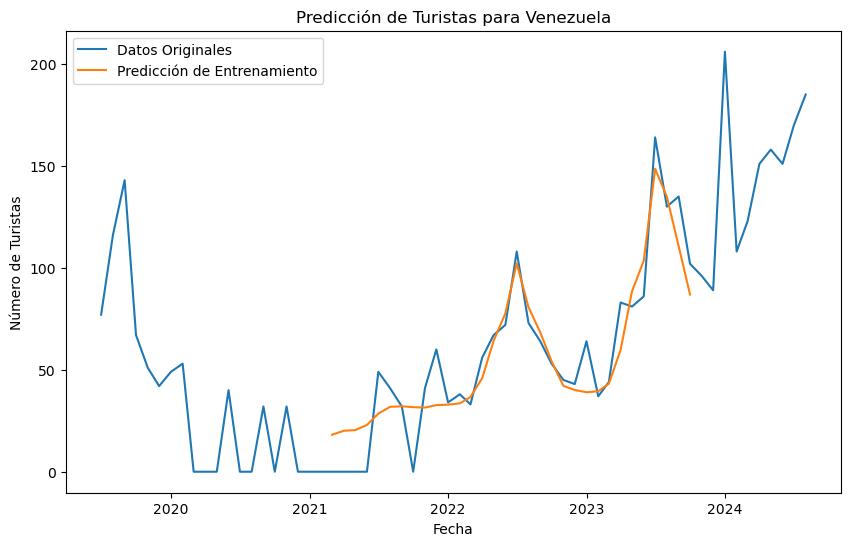

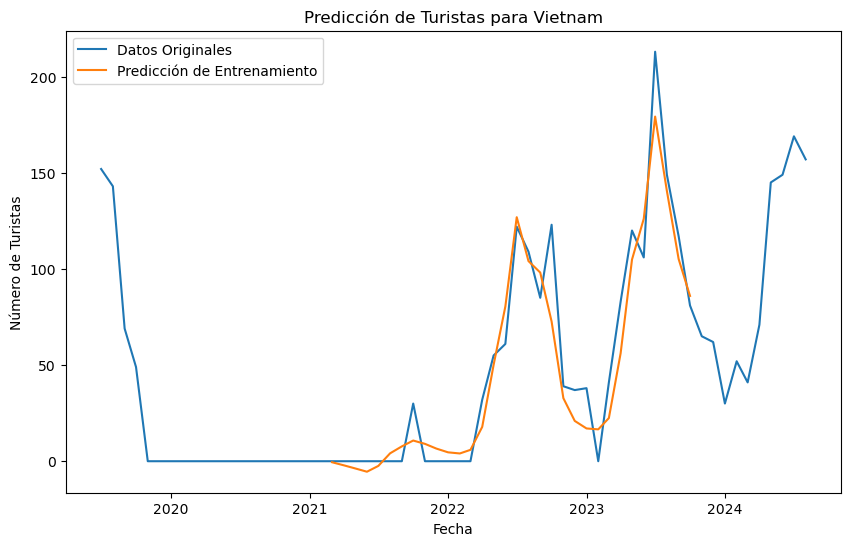

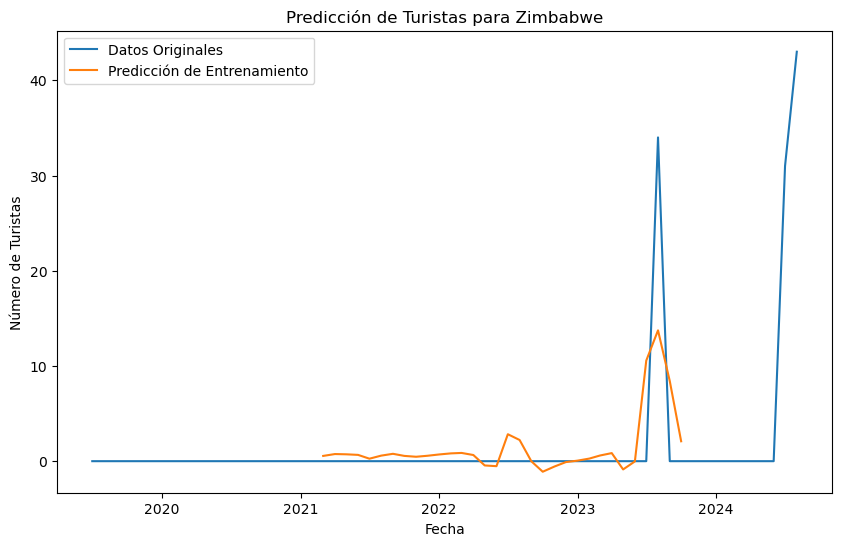

In [95]:

# Visualizar los resultados
for i, country in enumerate(pivot_data.columns):
    plt.figure(figsize=(10, 6))
    plt.plot(pivot_data.index, pivot_data[country], label='Datos Originales')
    if len(train_predict) + time_step <= len(pivot_data):
        plt.plot(pivot_data.index[time_step:len(train_predict)+time_step], train_predict[:, i], label='Predicción de Entrenamiento')
    if len(test_predict) + len(train_predict) + (time_step * 2) + 1 <= len(pivot_data):
        plt.plot(pivot_data.index[len(train_predict)+(time_step*2)+1:len(pivot_data)-1], test_predict[:, i], label='Predicción de Prueba')
    plt.title(f'Predicción de Turistas para {country}')
    plt.xlabel('Fecha')
    plt.ylabel('Número de Turistas')
    plt.legend()
    plt.show()


In [96]:
# Crear un DataFrame con los resultados
def create_results_df(real_data, pred_data, dates, countries):
    results = []
    for i in range(len(pred_data)):
        for j in range(len(countries)):
            results.append({
                'Fecha': dates[i],
                'CCAA': 'Illes Balears',
                'Pais_Origen': countries[j],
                'Flujo_Turístico_Real': real_data[i][j],
                'Flujo_Turístico_Predicho': pred_data[i][j]
            })
    return pd.DataFrame(results)



In [97]:
# Obtener las fechas para el conjunto de prueba
test_dates = pivot_data.index[train_size + time_step:train_size + time_step + len(test_predict)]

# Crear el DataFrame con los resultados
results_df = create_results_df(Y_test, test_predict, test_dates, pivot_data.columns)
print(results_df)

# Guardar los resultados en un archivo CSV
#results_df.to_csv('predicciones_turisticas.csv', index=False)

          Fecha           CCAA   Pais_Origen  Flujo_Turístico_Real  \
0    2023-11-01  Illes Balears       Albania                  31.0   
1    2023-11-01  Illes Balears      Alemania              101208.0   
2    2023-11-01  Illes Balears       Andorra                 197.0   
3    2023-11-01  Illes Balears        Angola                   0.0   
4    2023-11-01  Illes Balears  Arabia Saudí                  80.0   
...         ...            ...           ...                   ...   
1084 2024-07-01  Illes Balears       Uruguay                1892.0   
1085 2024-07-01  Illes Balears    Uzbekistán                  34.0   
1086 2024-07-01  Illes Balears     Venezuela                 170.0   
1087 2024-07-01  Illes Balears       Vietnam                 169.0   
1088 2024-07-01  Illes Balears      Zimbabwe                  31.0   

      Flujo_Turístico_Predicho  
0                    50.332905  
1                261618.078125  
2                   208.376587  
3                    16.735

### Prediccion 12 meses

In [99]:
future_steps = 12
future_predictions = []
last_data = scaled_data[-time_step:]  # Últimos datos como entrada
for _ in range(future_steps):
    pred = model.predict(last_data.reshape(1, time_step, -1))
    future_predictions.append(pred)
    last_data = np.append(last_data[1:], pred, axis=0)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


In [100]:

# Convertir las predicciones a un arreglo de numpy
future_predictions = np.array(future_predictions).reshape(future_steps, -1)

# Invertir la normalización de las predicciones
future_predictions = scaler.inverse_transform(future_predictions)

# Crear un DataFrame con las predicciones futuras
future_dates = pd.date_range(start=pivot_data.index[-1] + pd.Timedelta(days=30), periods=future_steps, freq='MS')
future_df = pd.DataFrame(future_predictions, columns=pivot_data.columns, index=future_dates)

# Mostrar la tabla con las predicciones
print("Predicciones de turistas para los próximos 12 meses:")
print(future_df)
#future_df.to_csv('predicciones_turisticas_balears.csv', index=True)

Predicciones de turistas para los próximos 12 meses:
PAIS_ORIGEN     Albania       Alemania      Andorra     Angola  Arabia Saudí  \
2024-09-01   191.963028  558714.562500   767.192261  50.105934    732.123230   
2024-10-01    93.086128  410966.218750   390.315308  24.824652    172.264328   
2024-11-01    36.818066  199019.453125   160.184769  12.254954    -24.736959   
2024-12-01    23.381960  107629.468750   110.354698   9.172736      1.984276   
2025-01-01    18.370722   81139.960938    98.265213   7.775609     25.198036   
2025-02-01    18.778629   81285.625000   106.588768   7.328262     44.193253   
2025-03-01    29.108341  121177.351562   166.054413   7.897801     71.855789   
2025-04-01    71.221642  319159.968750   426.855530   8.064406    156.875961   
2025-05-01   143.220261  560599.812500   736.828247   5.451739    281.628387   
2025-06-01   237.823669  558852.312500   922.767639  24.947096    728.620178   
2025-07-01   352.726166  564640.375000  1201.650635  79.166191   16

In [ ]:
# Cargar el archivo de credenciales
gc = gspread.service_account(filename='/Users/lorenacampoverdevilela/Downloads/lab-gd-437321-359106a1737d.json')

# Abrir el Google Sheet (por nombre o ID)
spreadsheet_url = 'https://docs.google.com/spreadsheets/d/1xuZONkiXFqqQykCHITpb6EWlyQpEYptq-uHJSKS8dNo/edit?usp=sharing'
spreadsheet = gc.open_by_url(spreadsheet_url)
worksheet = spreadsheet.sheet1

In [ ]:
# Subir el DataFrame a Google Sheets
set_with_dataframe(worksheet, future_df)

print("DataFrame subido con éxito.")

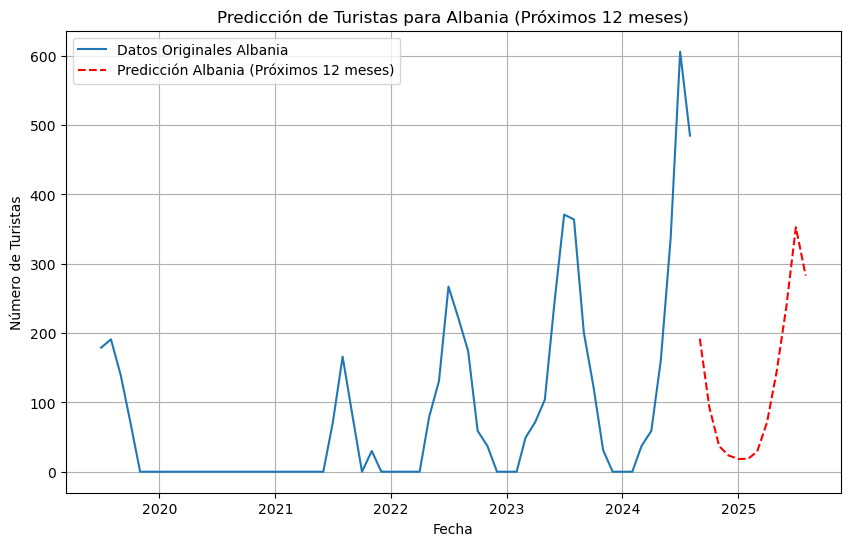

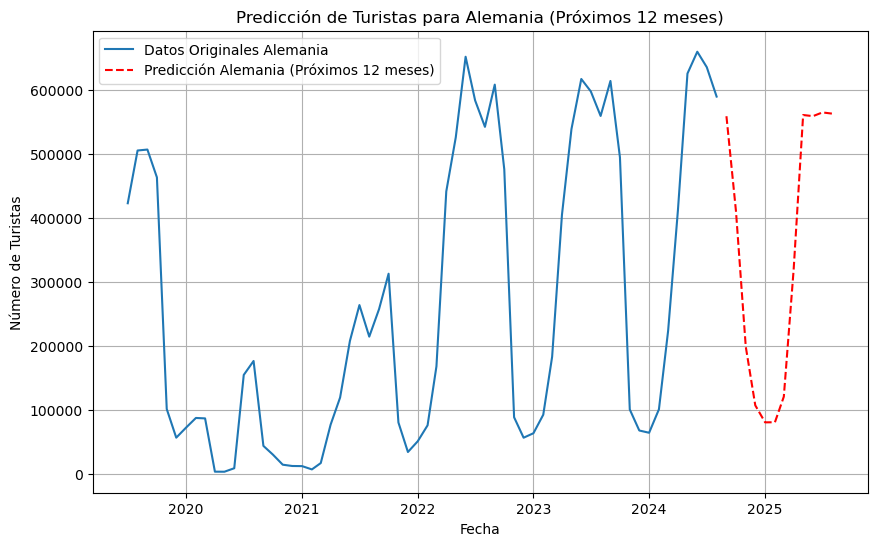

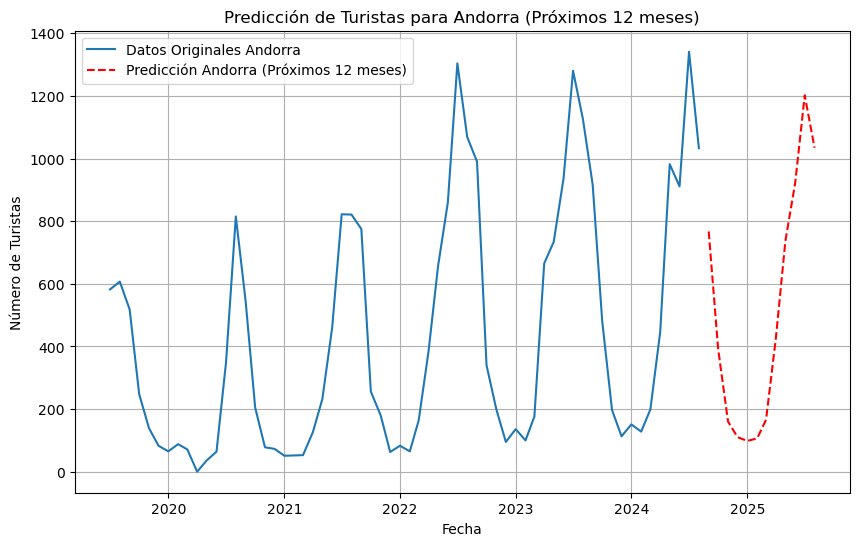

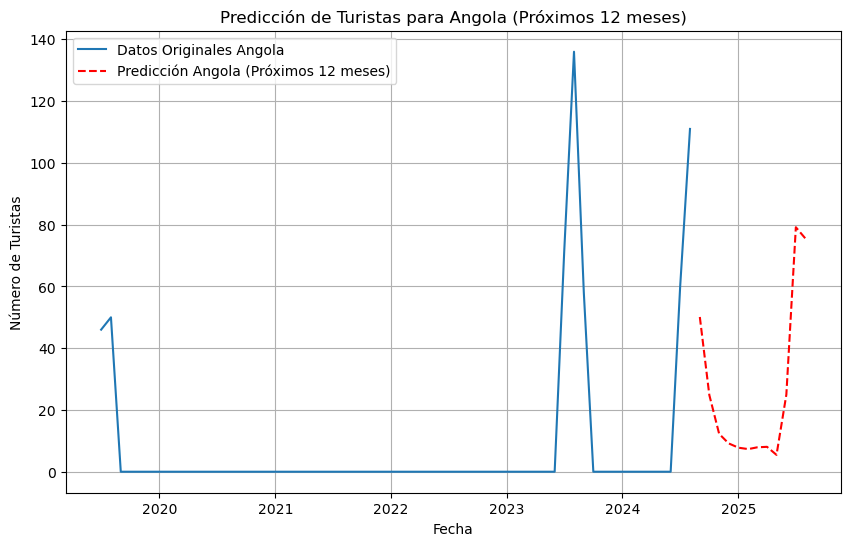

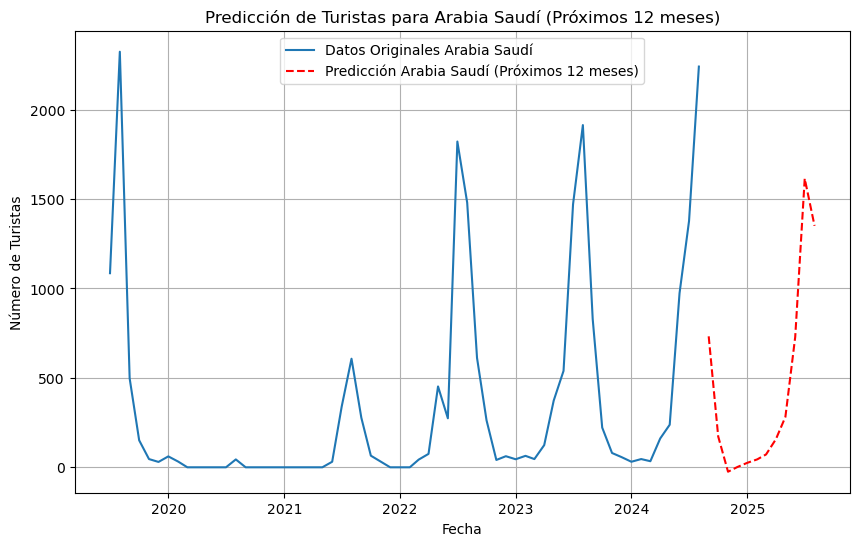

...

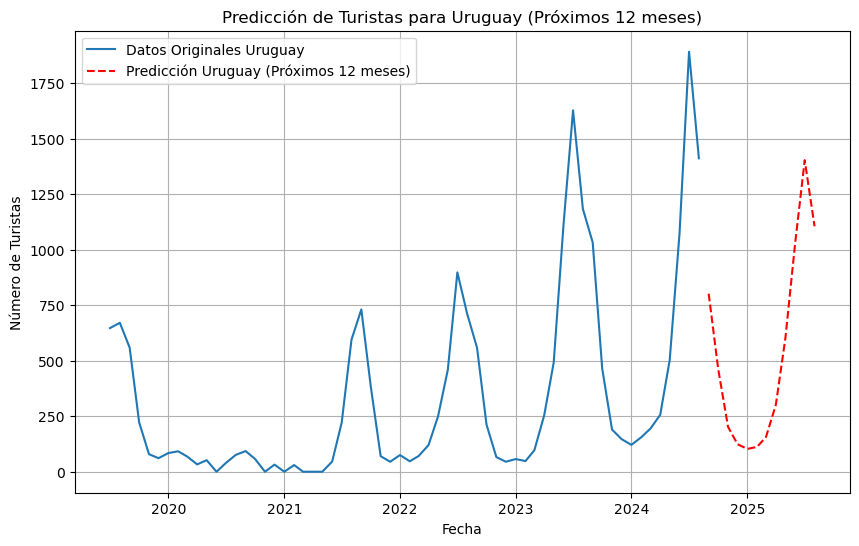

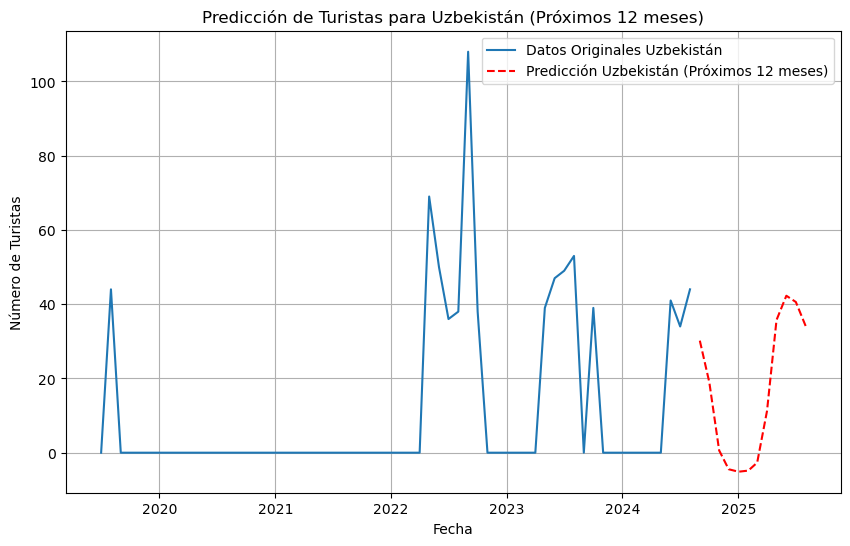

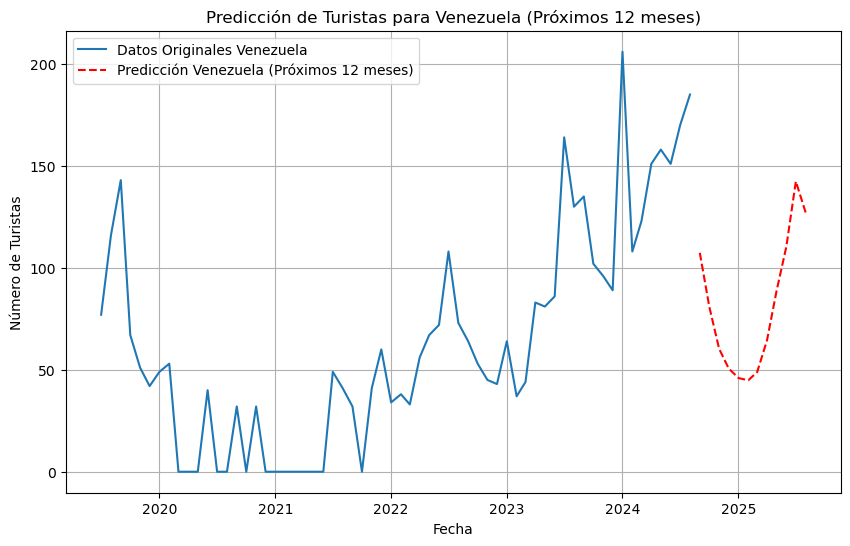

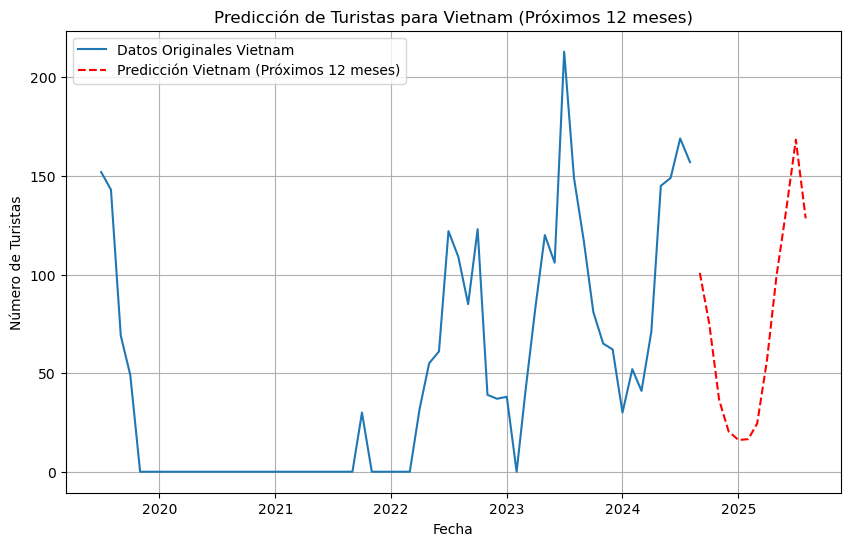

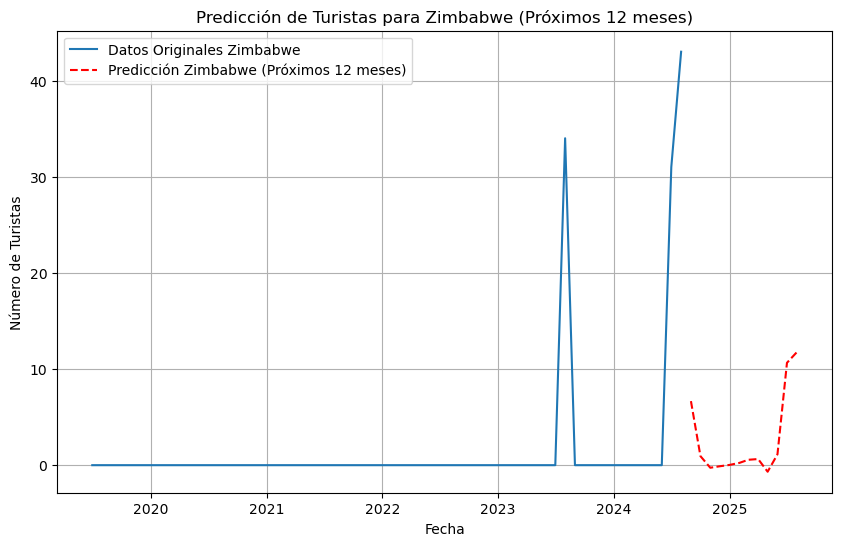

In [101]:
# Graficar las predicciones de los próximos 12 meses para cada país
for i, country in enumerate(pivot_data.columns):
    plt.figure(figsize=(10, 6))
    
    # Graficar los datos históricos
    plt.plot(pivot_data.index, pivot_data[country], label=f'Datos Originales {country}')
    
    # Graficar las predicciones de los próximos 12 meses
    plt.plot(future_df.index, future_df[country], label=f'Predicción {country} (Próximos 12 meses)', color='red', linestyle='--')
    
    # Personalizar el gráfico
    plt.title(f'Predicción de Turistas para {country} (Próximos 12 meses)')
    plt.xlabel('Fecha')
    plt.ylabel('Número de Turistas')
    plt.legend()
    plt.grid(True)
    plt.show()
